In [1]:

%matplotlib inline
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
from google.colab import drive

!pip install pyg-nightly
!pip install scipy==1.8.1
!pip install -q grpcio



In [2]:
import gzip

G = nx.Graph()
file_path = '/content/drive/MyDrive/GraphAnalysis/inf-USAir97.mtx'

with open(file_path, 'r') as file:
    for line in file:
        if line.startswith('%') or not line.strip():  # Skip headers or empty lines
            continue
        # Assume edges are represented as "node1 node2" per line
        parts = line.strip().split()
        if len(parts) >= 2:  # Basic validation
            G.add_edge(parts[0], parts[1])


In [3]:
#import networkx as nx
#G = nx.from_pandas_edgelist(liveJournal, "start_node", "end_node")

n = len(G)
m = len(G.edges())
n, m


(332, 2127)

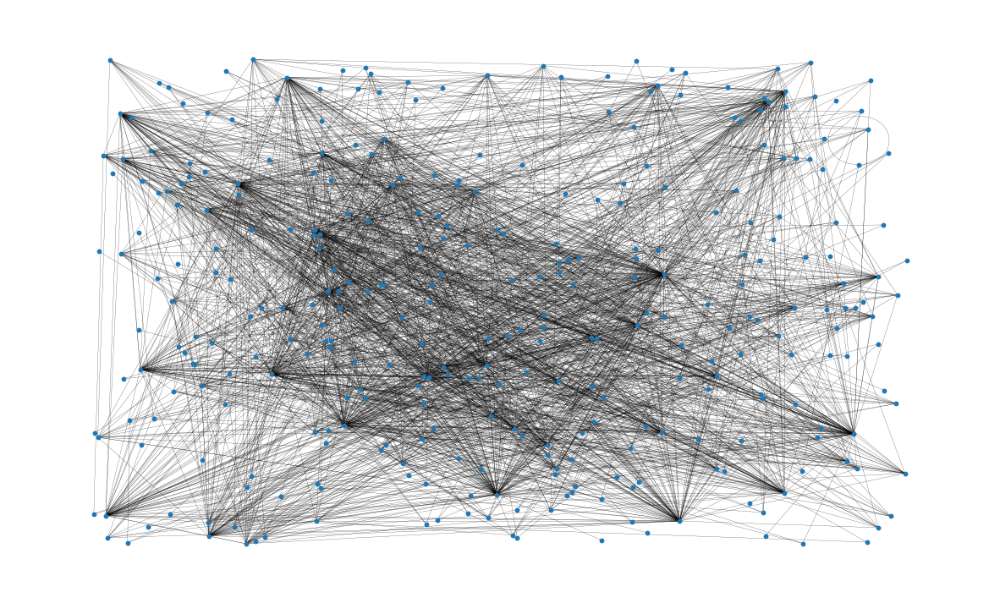

In [4]:
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

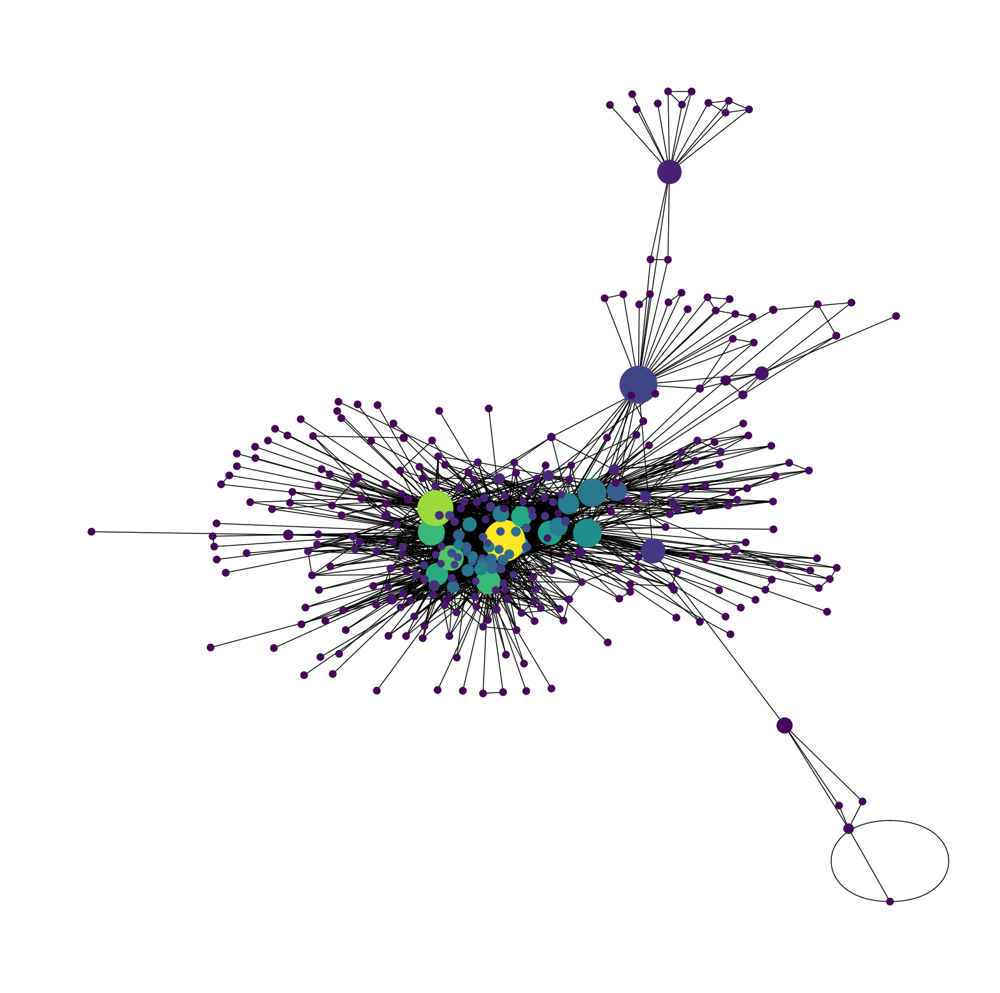

In [5]:
import networkx as nx
from scipy.io import mmread
pos = nx.spring_layout(G)
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_color = [20000.0 * G.degree(v) for v in G]
node_size =  [v * 10000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size )
plt.axis('off');

In [6]:
#Total number of nodes in network
G.number_of_nodes()


332

In [7]:
#Total number of edges
G.number_of_edges()

2127

In [8]:
np.mean([d for _, d in G.degree()])

12.813253012048193

In [9]:
degree_centrality = nx.centrality.degree_centrality(G)
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[('118', 0.4199395770392749),
 ('261', 0.3564954682779456),
 ('255', 0.30513595166163143),
 ('152', 0.283987915407855),
 ('182', 0.283987915407855),
 ('230', 0.2628398791540785),
 ('166', 0.256797583081571),
 ('67', 0.23564954682779457)]

(-0.6421667789598406,
 0.5767481741379553,
 -1.1389450550667986,
 1.2032481726534061)

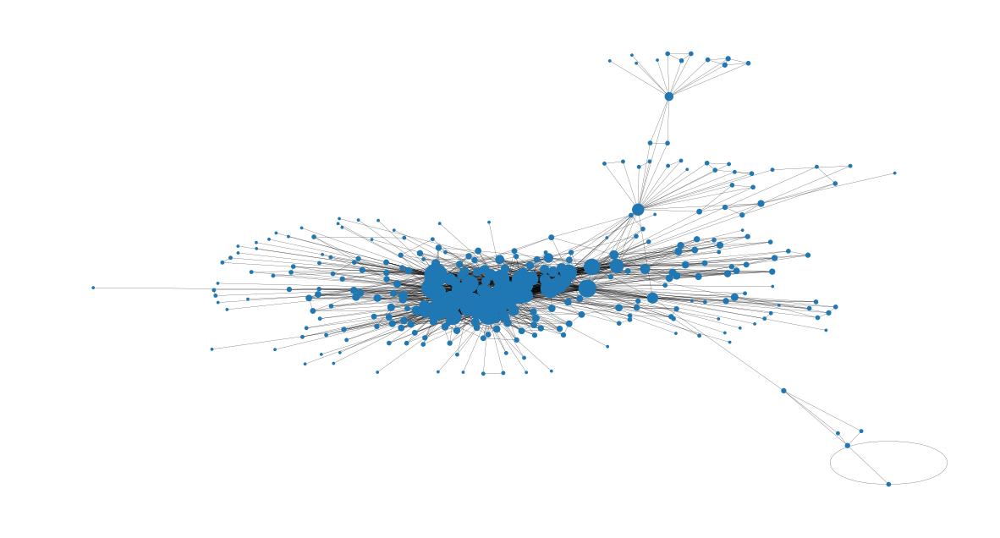

In [10]:
node_size = [
    v * 1000 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [11]:
betweenness_centrality = nx.centrality.betweenness_centrality(
    G
)  # save results in a variable to use again
(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[('118', 0.2083058698588695),
 ('8', 0.17006973867446296),
 ('261', 0.15319554114303371),
 ('201', 0.09422863574735517),
 ('47', 0.09281838103560969),
 ('182', 0.0815465164008431),
 ('255', 0.07149967942367381),
 ('152', 0.06930486445174279)]

(-0.6421667789598406,
 0.5767481741379553,
 -1.1389450550667986,
 1.2032481726534061)

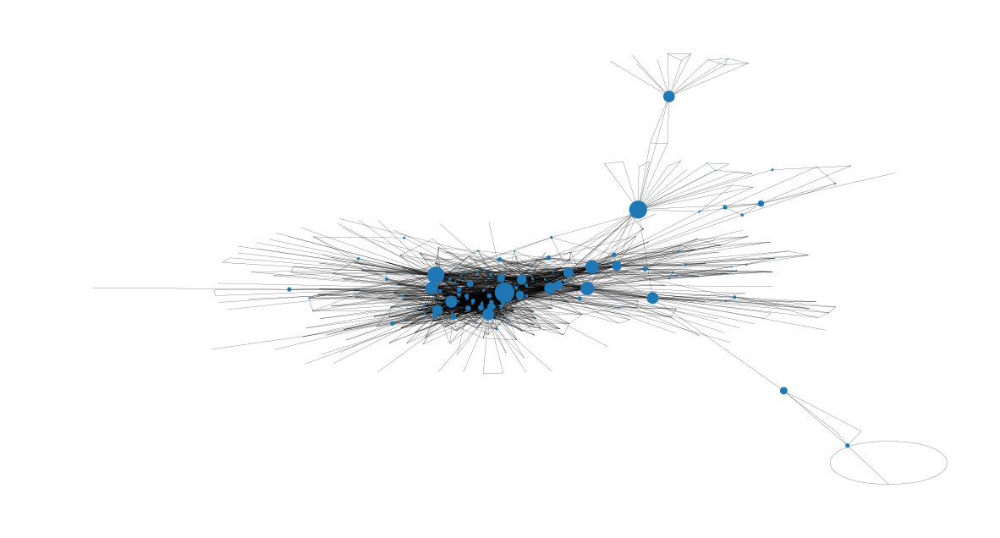

In [12]:
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [13]:
print('#nodes:', len(G.nodes()), 'and', '#edges:', len(G.edges()))

#nodes: 332 and #edges: 2127


In [15]:

node_color=[float(G.degree(v)) for v in G]
cmap = plt.cm.coolwarm

plt.figure(figsize=(9,9), dpi=1000)
pos = nx.nx_pydot.graphviz_layout(G,prog="fdp")
nx.draw(G, pos, node_color=node_color, node_size=30, edge_color='k',
        width=3, with_labels=True, cmap=cmap)

plt.show()


<ipython-input-15-9730dcd19bf1>:5: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which has known issues and is not actively maintained. Consider using nx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = nx.nx_pydot.graphviz_layout(G,prog="fdp")


In [16]:
# Graph Density
nx.density(G)

0.038710734175372186

In [ ]:
# Average Shortest Path Lenght
nx.average_shortest_path_length(G)

18.989185424445708

In [17]:
nx.diameter(G)

6

<ipython-input-18-8a1b500bdf66>:2: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which has known issues and is not actively maintained. Consider using nx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = nx.nx_pydot.graphviz_layout(G,prog="dot")


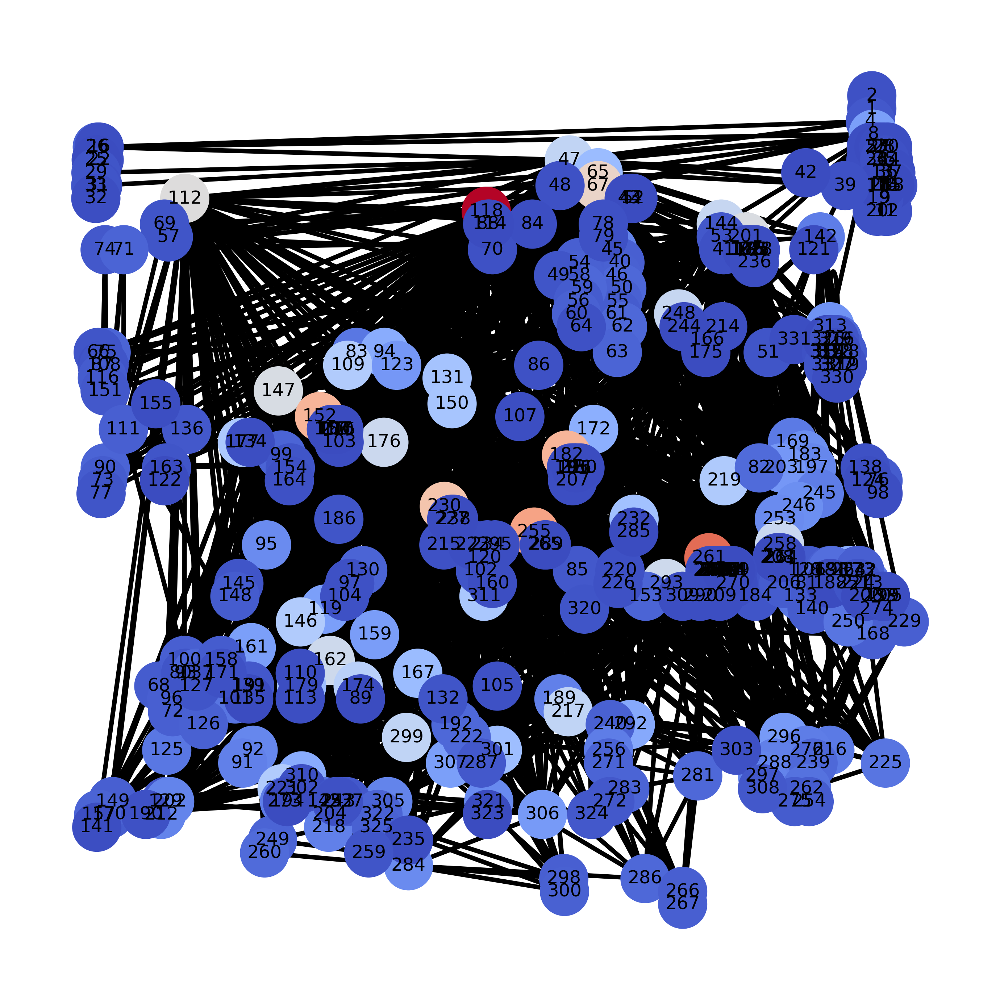

In [18]:
plt.figure(figsize=(9,9), dpi=300)
pos = nx.nx_pydot.graphviz_layout(G,prog="dot")
nx.draw(G, pos, node_color=node_color, node_size=1000, edge_color='k',
        width=3, with_labels=True, cmap=cmap)

plt.show()

<ipython-input-19-8d74fbe1ae73>:2: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which has known issues and is not actively maintained. Consider using nx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = nx.nx_pydot.graphviz_layout(G,prog="twopi", root=0)


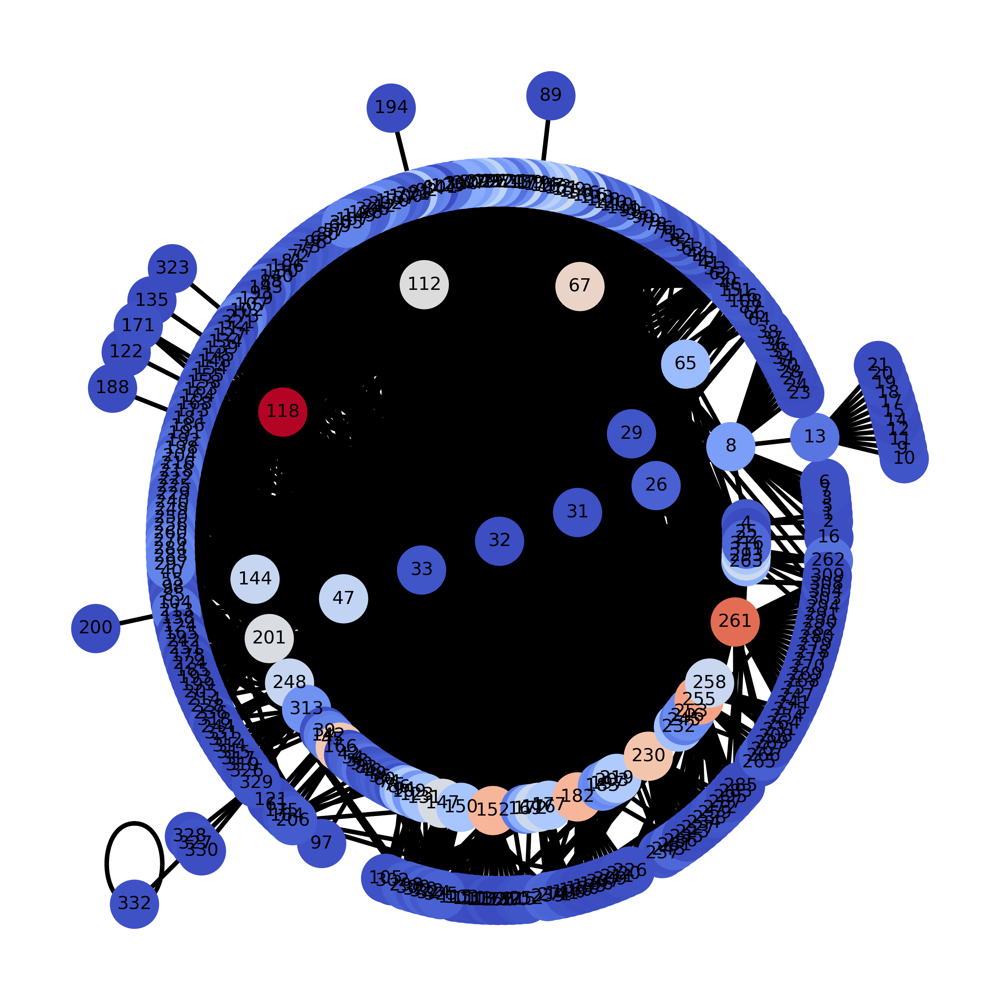

In [19]:
plt.figure(figsize=(9,9), dpi=300)
pos = nx.nx_pydot.graphviz_layout(G,prog="twopi", root=0)
nx.draw(G, pos, node_color=node_color, node_size=1000, edge_color='k',
        width=3, with_labels=True, cmap=cmap)

plt.show()

In [20]:
# Community Detection using Modularity
from networkx.algorithms.community import greedy_modularity_communities
greedy_modularity_communities(G)

[frozenset({'100',
            '101',
            '102',
            '103',
            '105',
            '106',
            '107',
            '109',
            '110',
            '111',
            '112',
            '113',
            '114',
            '115',
            '117',
            '118',
            '119',
            '120',
            '122',
            '123',
            '125',
            '126',
            '127',
            '129',
            '130',
            '131',
            '132',
            '134',
            '135',
            '136',
            '137',
            '139',
            '140',
            '141',
            '143',
            '145',
            '146',
            '147',
            '148',
            '149',
            '150',
            '152',
            '154',
            '155',
            '156',
            '157',
            '158',
            '159',
            '160',
            '161',
            '162',
            '163',
            

In [21]:
print (list(nx.find_cliques(G)))


[['298', '255', '221', '147', '230', '284', '300'], ['298', '255', '221', '147', '230', '284', '299'], ['315', '317', '313', '316'], ['29', '26', '31'], ['29', '26', '33', '47'], ['98', '76', '144'], ['25', '26'], ['328', '329', '327'], ['180', '182'], ['15', '13'], ['271', '255', '261', '267', '281', '283'], ['271', '255', '261', '267', '281', '266'], ['271', '255', '261', '267', '256'], ['271', '255', '261', '217', '283', '281'], ['271', '255', '261', '217', '176', '256'], ['329', '327', '330'], ['329', '313'], ['142', '121'], ['142', '76', '144'], ['142', '229', '261', '233'], ['142', '166', '261', '128'], ['142', '166', '261', '293', '144', '65', '47'], ['142', '166', '261', '293', '144', '233'], ['142', '166', '261', '293', '144', '172', '47'], ['142', '166', '261', '293', '144', '172', '225', '216'], ['142', '166', '261', '198', '216', '172'], ['142', '166', '45', '47', '65', '144'], ['142', '39', '47', '65'], ['17', '20', '19', '13'], ['117', '152'], ['226', '220', '261', '182']

In [22]:
def edge_to_remove(graph):
  G_dict = nx.edge_betweenness_centrality(graph)
  edge = ()

  # extract the edge with highest edge betweenness centrality score
  for key, value in sorted(G_dict.items(), key=lambda item: item[1], reverse = True):
      edge = key
      break
  return edge

In [23]:
def girvan_newman(graph):
	# find number of connected components
	sg = nx.connected_components(graph)
	sg_count = nx.number_connected_components(graph)

	while(sg_count == 1):
		graph.remove_edge(edge_to_remove(graph)[0], edge_to_remove(graph)[1])
		sg = nx.connected_components(graph)
		sg_count = nx.number_connected_components(graph)

	return sg

In [24]:
# find communities in the graph
c = girvan_newman(G.copy())

# find the nodes forming the communities
node_groups = []

for i in c:
  node_groups.append(list(i))

In [25]:
node_groups

[['29',
  '139',
  '88',
  '218',
  '328',
  '180',
  '163',
  '56',
  '209',
  '138',
  '307',
  '294',
  '189',
  '179',
  '255',
  '197',
  '82',
  '208',
  '89',
  '256',
  '182',
  '43',
  '169',
  '68',
  '288',
  '273',
  '320',
  '152',
  '30',
  '35',
  '188',
  '108',
  '297',
  '272',
  '33',
  '53',
  '241',
  '115',
  '229',
  '224',
  '67',
  '322',
  '175',
  '277',
  '77',
  '106',
  '120',
  '134',
  '113',
  '235',
  '65',
  '223',
  '102',
  '23',
  '159',
  '46',
  '321',
  '194',
  '121',
  '243',
  '144',
  '38',
  '240',
  '309',
  '61',
  '316',
  '261',
  '187',
  '16',
  '263',
  '146',
  '305',
  '48',
  '213',
  '86',
  '122',
  '195',
  '281',
  '22',
  '118',
  '200',
  '302',
  '276',
  '191',
  '291',
  '267',
  '98',
  '81',
  '129',
  '271',
  '329',
  '142',
  '317',
  '226',
  '117',
  '94',
  '110',
  '279',
  '97',
  '262',
  '202',
  '225',
  '76',
  '228',
  '50',
  '154',
  '285',
  '64',
  '275',
  '143',
  '238',
  '157',
  '318',
  '74',
  '9

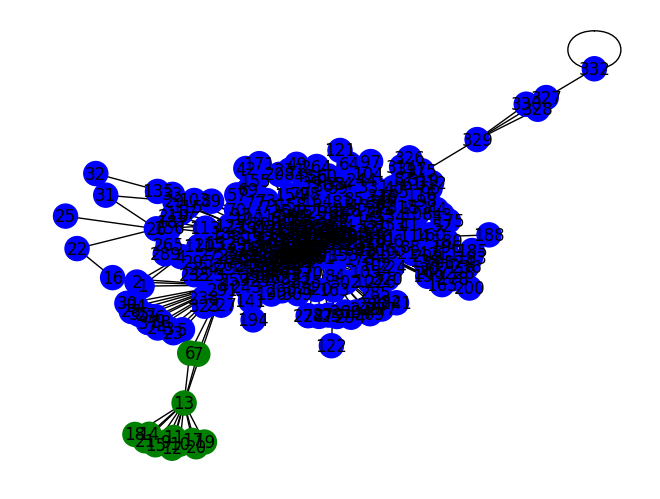

In [26]:
# plot the communities
color_map = []
for node in G:
    if node in node_groups[0]:
        color_map.append('blue')
    else:
        color_map.append('green')

nx.draw(G, node_color=color_map, with_labels=True)
plt.show()